## Setup

In [1]:
################################
# Imports
################################

import time
import requests
import zipfile
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import numpy as np
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import segmentation_models as sm
from segmentation_models.metrics import iou_score
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard, CSVLogger
import json
from itertools import product
import random
import tensorflow as tf
import gc
from scipy.ndimage import rotate
import pandas as pd

2024-09-30 22:14:04.108541: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-30 22:14:04.127970: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-30 22:14:04.133322: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-30 22:14:04.146514: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-30 22:14:05.206830: W tensorflow/compiler/tf2

Segmentation Models: using `tf.keras` framework.


In [2]:
# setar as sementes de aleatoriedade para reprodutilibilidade dos experimentos
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [3]:
################################
# PATHS
################################

DATA_DIR = 'data/raw/'
PATH_MODELS = "models/"
PATH_LOGS = "logs/"
RESULTS_PATH = "results/"
MODELS_PATH = 'models/'
MODELS_IMAGES_PATH = 'images/models/'
IMAGES_PATH = "images/"

# Caminho raiz dos dados
rootfolder = 'data/raw'

# Diretórios de entrada e alvo
input_dir = f'{rootfolder}/training/input'
target_dir = f'{rootfolder}/training/target'

## Funções e classes auxiliares

Para realizar a segmentação de imagens, foi escolhido utilizar o keras para criar os modelos através da biblioteca segmentation_models que oferece uma série de modelos de utilitários para segmentação de imagens, incluido modelos prontos, utilizando o keras. Dessa forma, foi utilizado os código abaixo como inspiração para construir a solução disposta nesse notebook:

- solução bem votada no kaggle: https://www.kaggle.com/code/ipythonx/retinal-vessel-segmentation-starter#Callback-:-Monitoring-Training-Progress
- exemplo de segmentação binária disposto no repositório da biblioteca segmentation_models: https://github.com/qubvel/segmentation_models/blob/master/examples/binary%20segmentation%20(camvid).ipynb

In [4]:
################################
# classes e funções auxiliares
################################

class DRIVEDataset(keras.utils.Sequence):
    def __init__(self, root_dir=None, input_paths=None, target_paths=None, batch_size=1, image_size=(256, 256), shuffle=True):
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle

        if input_paths is not None and target_paths is not None:
            self.input_paths = input_paths
            self.target_paths = target_paths
        elif root_dir is not None:
            self.input_paths = sorted([os.path.join(root_dir, 'input', path) for path in os.listdir(os.path.join(root_dir, 'input'))])
            self.target_paths = sorted([os.path.join(root_dir, 'target', path) for path in os.listdir(os.path.join(root_dir, 'target'))])
        else:
            raise ValueError("Você deve fornecer 'root_dir' ou 'input_paths' e 'target_paths'.")

        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.input_paths) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        batch_input_paths = [self.input_paths[i] for i in indexes]
        batch_target_paths = [self.target_paths[i] for i in indexes]

        X, y = self.__data_generation(batch_input_paths, batch_target_paths)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.input_paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)
    
    def __data_generation(self, batch_input_paths, batch_target_paths):
        X = np.empty((self.batch_size, *self.image_size, 3), dtype=np.float32)  # Ensure float32
        y = np.empty((self.batch_size, *self.image_size, 1), dtype=np.float32)  # Ensure float32

        for i, (input_path, target_path) in enumerate(zip(batch_input_paths, batch_target_paths)):
            input_img = load_img(input_path, target_size=self.image_size)
            target_img = load_img(target_path, target_size=self.image_size, color_mode='grayscale')

            X[i,] = img_to_array(input_img).astype('float32') / 255.0
            y[i,] = img_to_array(target_img).astype('float32') / 255.0

        return X, y


    def viewitem(self, image_index):
        fig, axes = plt.subplots(1, 2, figsize=(6, 3))
        axes[0].imshow(load_img(self.input_paths[image_index]))
        axes[0].set_title('Input')
        axes[0].axis('off')

        # Exibe a máscara em tons de cinza
        axes[1].imshow(load_img(self.target_paths[image_index], color_mode='grayscale'), cmap='gray')
        axes[1].set_title('Target')
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()
        
# Define the augmentation function without TensorFlow Addons
def augment_batch(images, masks):
    images_aug = np.empty_like(images)
    masks_aug = np.empty_like(masks)

    for i in range(images.shape[0]):
        image = images[i]
        mask = masks[i]

        # Apply random horizontal flip
        if np.random.rand() < 0.5:
            image = np.fliplr(image)
            mask = np.fliplr(mask)

        # Apply random vertical flip
        if np.random.rand() < 0.5:
            image = np.flipud(image)
            mask = np.flipud(mask)

        # Apply random rotation between -30 and 30 degrees
        angle = np.random.uniform(-30, 30)
        image = rotate(image, angle, reshape=False, order=1, mode='reflect')
        mask = rotate(mask, angle, reshape=False, order=0, mode='reflect')

        images_aug[i] = image
        masks_aug[i] = mask

    return images_aug, masks_aug

# Create the augmented dataset wrapper
class AugmentedDataset(keras.utils.Sequence):
    def __init__(self, base_dataset, augment_fn):
        self.base_dataset = base_dataset
        self.augment_fn = augment_fn

    def __len__(self):
        return len(self.base_dataset)

    def __getitem__(self, idx):
        X, y = self.base_dataset[idx]

        # Ensure X and y are numpy arrays
        if isinstance(X, tf.Tensor):
            X = X.numpy()
        if isinstance(y, tf.Tensor):
            y = y.numpy()

        X_aug, y_aug = self.augment_fn(X, y)
        return X_aug, y_aug

    def on_epoch_end(self):
        self.base_dataset.on_epoch_end()

## Leitura e tratamento dos dados

A separação de treino e teste é definida já na estrutura original do conjunto de dados. Assim sendo, o conjunto de treino foi dividido em duas partes, onde 70% dos dados serão para treino e 30% para validação. 

Além disso, o conjunto de treino foi aumentado (data augmentation) utilizando a classe AugmentedDataset criada acima, onde cria um novo objeto de dataset onde realiza as transformações do data augmentation ao usar um \_\_getitem\_\_().  

In [5]:
#####################
# leitura do dataset 
#####################

# Obter listas de caminhos das imagens
input_paths = sorted([os.path.join(input_dir, fname) for fname in os.listdir(input_dir)])
target_paths = sorted([os.path.join(target_dir, fname) for fname in os.listdir(target_dir)])

# Embaralhar os dados
indices = np.arange(len(input_paths))
np.random.shuffle(indices)

input_paths = np.array(input_paths)[indices]
target_paths = np.array(target_paths)[indices]

# Dividir em treino e validação
split_index = int(len(input_paths) * 0.7)
train_input_paths = input_paths[:split_index]
train_target_paths = target_paths[:split_index]
val_input_paths = input_paths[split_index:]
val_target_paths = target_paths[split_index:]

# Criar instâncias dos datasets
train_dataset = DRIVEDataset(input_paths=train_input_paths, target_paths=train_target_paths, batch_size=1)
val_dataset = DRIVEDataset(input_paths=val_input_paths, target_paths=val_target_paths, batch_size=1)
test_dataset = DRIVEDataset(root_dir=f'{rootfolder}/test', batch_size=1)
train_dataset_aug = AugmentedDataset(train_dataset, augment_batch)  # Create the augmented dataset

Exemplo de treino


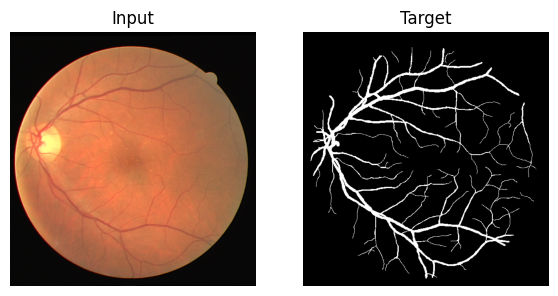

Exemplo de validação


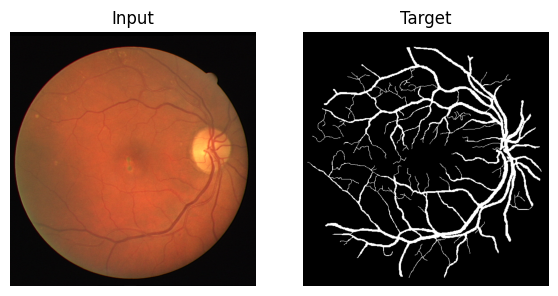

Exemplo de teste


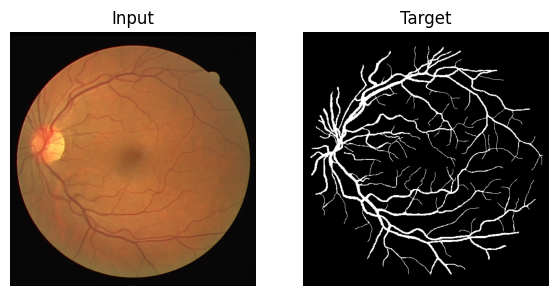

In [6]:
#######################
# Visualizar exemplos
#######################
print('Exemplo de treino')
train_dataset.viewitem(0)
print('Exemplo de validação')
val_dataset.viewitem(0)
print('Exemplo de teste')
test_dataset.viewitem(0)

## Criação dos modelos

Os experimentos realizados consistem em variar a função de ativação entre sigmoid e softmax, além de testar o modelo com um backbone de uma efficientnetb0 e também sem esse backbone, a biblioteca segmentation_models facilita a utilização de backbones e a escolha pela resnet34 como backbone foi por conta de ser uma rede mais "leve" de se executar em comparação à outros backbones disponíveis.

Além disso, foi tentado testar um data augmentation no conjunto de treino, que está contido na variável `train_dataset_aug`.

In [7]:
###################################
# configuração dos experimentos
###################################

# numero de classes
n_classes = 1

# data augmentation
augmentation_list=[True, False]

# funcoes de ativacao
activation_list = ['sigmoid', 'softmax']

# backbones a serem testados
backbone_list = [
    # 'resnet34',
    'efficientnetb0', 
    None
    ]

# metricas acompanhadas ao longo das epocas
METRICS = [iou_score,'precision','recall','accuracy']

# numero maximo de epocas (será utilizado early stopping)
EPOCHS = 1000

# otimizador
OPTIM = 'adam'

# definir funcao de loss
dice_loss = sm.losses.dice_loss
focal_loss = sm.losses.binary_focal_loss

total_loss = dice_loss + (1 * focal_loss)

LOSS = dice_loss#'binary_crossentropy'

In [8]:
# define configuração dos experimentos
experimentos = list(product(backbone_list, activation_list, augmentation_list))

# numero de experimentos
n_exp = len(list(experimentos))


In [9]:
###################################
# experimentos
###################################


i = 0
for backbone,activation, augmentation in experimentos:
    
    i += 1
    
    print(f'''
#################################################
# exp {i}/{n_exp} - {backbone,activation, augmentation}           
#################################################''')
    
    model_name = f'model_{backbone}_{activation}_aug={augmentation}'
    model_weights = PATH_MODELS + f'weights/best_{model_name}.weights.h5'
    
    # limpar sessão e garbace collector
    keras.backend.clear_session()
    gc.collect()

    # define o modelo com ou sem backbone
    if backbone is not None:
        model = sm.Unet(backbone, classes=n_classes,activation = activation)
        # model = sm.Unet(backbone, encoder_weights='imagenet', input_shape=(256, 256, 3))
    else:
        model = sm.Unet(classes=n_classes,activation = activation)

    # define callbacks dos models
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=20),
        ModelCheckpoint(PATH_MODELS + f'model_file/best_{model_name}.keras', save_best_only=True, monitor='val_loss'),
        ModelCheckpoint(model_weights, save_weights_only=True, save_best_only=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5),
        TensorBoard(log_dir=PATH_LOGS),
        CSVLogger(PATH_MODELS + f'training_log_{model_name}.csv'),
    ]

    # compila o modelo
    model.compile(optimizer=OPTIM, loss=LOSS, metrics=METRICS)

    # treina o modelo
    history = model.fit(
         train_dataset_aug if augmentation else train_dataset, # define se o conjunto de dados será o aumentado ou o "normal"
        validation_data=val_dataset, 
        epochs=EPOCHS, 
        steps_per_epoch=len(val_dataset), 
        validation_steps=len(val_dataset),
        verbose=True,
        callbacks = callbacks
        )

    # salva hitory do modelo
    json.dump(history.history, open(RESULTS_PATH + f"history/history_{model_name}.json", "w"))


#################################################
# exp 1/8 - ('efficientnetb0', 'sigmoid', True)           
#################################################


2024-09-30 22:14:08.478277: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_UNKNOWN: unknown error
2024-09-30 22:14:08.478299: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:135] retrieving CUDA diagnostic information for host: pop-os
2024-09-30 22:14:08.478304: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:142] hostname: pop-os
2024-09-30 22:14:08.478371: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:166] libcuda reported version is: 560.35.3
2024-09-30 22:14:08.478386: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:170] kernel reported version is: 560.35.3
2024-09-30 22:14:08.478390: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:249] kernel version seems to match DSO: 560.35.3


Epoch 1/1000


/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 55s 2s/step - accuracy: 0.7014 - iou_score: 0.0972 - loss: 0.8240 - precision: 0.1456 - recall: 0.5394 - val_accuracy: 0.1027 - val_iou_score: 0.0904 - val_loss: 0.8344 - val_precision: 0.0867 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 828ms/step - accuracy: 0.7642 - iou_score: 0.1835 - loss: 0.6906 - precision: 0.2765 - recall: 0.8434 - learning_rate: 0.0010
Epoch 3/1000


2024-09-30 22:15:09.944417: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/site-packages/keras/src/callbacks/early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,iou_score,loss,precision,recall
  current = self.get_monitor_value(logs)
/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/

2/6 ━━━━━━━━━━━━━━━━━━━━ 3s 761ms/step - accuracy: 0.7920 - iou_score: 0.1608 - loss: 0.7231 - precision: 0.2381 - recall: 0.9010

2024-09-30 22:15:11.840144: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 799ms/step - accuracy: 0.8018 - iou_score: 0.1282 - loss: 0.7162 - precision: 0.2503 - recall: 0.8992 - val_accuracy: 0.1282 - val_iou_score: 0.0928 - val_loss: 0.8304 - val_precision: 0.0890 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 4/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 750ms/step - accuracy: 0.8432 - iou_score: 0.1971 - loss: 0.6715 - precision: 0.3199 - recall: 0.8794 - learning_rate: 0.0010
Epoch 5/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.8742 - iou_score: 0.2414 - loss: 0.6112 - precision: 0.3949 - recall: 0.8413 - val_accuracy: 0.2098 - val_iou_score: 0.1001 - val_loss: 0.8183 - val_precision: 0.0973 - val_recall: 0.9998 - learning_rate: 0.0010
Epoch 6/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9080 - iou_score: 0.2560 - loss: 0.5041 - precision: 0.5634 - recall: 0.8001 - learning_rate: 0.0010
Epoch 7/1000


2024-09-30 22:15:27.633440: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.9101 - iou_score: 0.2987 - loss: 0.5404 - precision: 0.4908 - recall: 0.8349 - val_accuracy: 0.6859 - val_iou_score: 0.1349 - val_loss: 0.7626 - val_precision: 0.1875 - val_recall: 0.8057 - learning_rate: 0.0010
Epoch 8/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 682ms/step - accuracy: 0.9208 - iou_score: 0.3273 - loss: 0.5075 - precision: 0.5321 - recall: 0.7823 - learning_rate: 0.0010
Epoch 9/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 631ms/step - accuracy: 0.9305 - iou_score: 0.2857 - loss: 0.4624 - precision: 0.5682 - recall: 0.7892 - val_accuracy: 0.8071 - val_iou_score: 0.1618 - val_loss: 0.7219 - val_precision: 0.2503 - val_recall: 0.6339 - learning_rate: 0.0010
Epoch 10/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 699ms/step - accuracy: 0.9312 - iou_score: 0.3855 - loss: 0.4436 - precision: 0.5943 - recall: 0.7502 - learning_rate: 0.0010
Epoch 11/1000


2024-09-30 22:15:46.764730: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 813ms/step - accuracy: 0.9332 - iou_score: 0.3999 - loss: 0.4299 - precision: 0.6168 - recall: 0.7060 - val_accuracy: 0.6421 - val_iou_score: 0.1209 - val_loss: 0.7850 - val_precision: 0.1433 - val_recall: 0.6427 - learning_rate: 0.0010
Epoch 12/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - accuracy: 0.9444 - iou_score: 0.3474 - loss: 0.3823 - precision: 0.6333 - recall: 0.7768 - learning_rate: 0.0010
Epoch 13/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 813ms/step - accuracy: 0.9290 - iou_score: 0.4148 - loss: 0.4149 - precision: 0.5972 - recall: 0.6950 - val_accuracy: 0.3685 - val_iou_score: 0.1043 - val_loss: 0.8114 - val_precision: 0.1077 - val_recall: 0.8802 - learning_rate: 0.0010
Epoch 14/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 700ms/step - accuracy: 0.9426 - iou_score: 0.4744 - loss: 0.3565 - precision: 0.7090 - recall: 0.6943 - learning_rate: 0.0010
Epoch 15/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - accuracy: 0.9471 - iou_score: 0.3991 - loss: 0.3227 - precision: 

2024-09-30 22:16:25.893877: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - accuracy: 0.9492 - iou_score: 0.3992 - loss: 0.3217 - precision: 0.7521 - recall: 0.6690 - val_accuracy: 0.4803 - val_iou_score: 0.1277 - val_loss: 0.7743 - val_precision: 0.1284 - val_recall: 0.8814 - learning_rate: 1.0000e-04
Epoch 22/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 769ms/step - accuracy: 0.9532 - iou_score: 0.5116 - loss: 0.3231 - precision: 0.6964 - recall: 0.7307 - learning_rate: 1.0000e-04
Epoch 23/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 897ms/step - accuracy: 0.9490 - iou_score: 0.5237 - loss: 0.3132 - precision: 0.7203 - recall: 0.7130 - val_accuracy: 0.4784 - val_iou_score: 0.1614 - val_loss: 0.7302 - val_precision: 0.1270 - val_recall: 0.8721 - learning_rate: 1.0000e-04
Epoch 24/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step - accuracy: 0.9561 - iou_score: 0.4225 - loss: 0.2964 - precision: 0.7160 - recall: 0.7577 - learning_rate: 1.0000e-04
Epoch 25/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.9456 - iou_score: 0.5046 - loss: 0.3303 

2024-09-30 22:17:39.705014: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 237ms/step - accuracy: 0.9539 - iou_score: 0.4090 - loss: 0.3102 - precision: 0.6827 - recall: 0.7573 - val_accuracy: 0.8107 - val_iou_score: 0.2432 - val_loss: 0.6103 - val_precision: 0.2829 - val_recall: 0.7966 - learning_rate: 1.0000e-04
Epoch 40/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 528ms/step - accuracy: 0.9434 - iou_score: 0.5041 - loss: 0.3304 - precision: 0.6857 - recall: 0.7031 - learning_rate: 1.0000e-05
Epoch 41/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 622ms/step - accuracy: 0.9525 - iou_score: 0.5365 - loss: 0.3018 - precision: 0.7383 - recall: 0.7168 - val_accuracy: 0.8459 - val_iou_score: 0.2750 - val_loss: 0.5714 - val_precision: 0.3164 - val_recall: 0.6967 - learning_rate: 1.0000e-05
Epoch 42/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - accuracy: 0.9477 - iou_score: 0.4254 - loss: 0.2931 - precision: 0.7570 - recall: 0.7092 - learning_rate: 1.0000e-05
Epoch 43/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 603ms/step - accuracy: 0.9481 - iou_score: 0.5318 - loss: 0.30

2024-09-30 22:19:50.458818: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 899ms/step - accuracy: 0.9497 - iou_score: 0.5406 - loss: 0.2983 - precision: 0.7584 - recall: 0.7001 - val_accuracy: 0.9587 - val_iou_score: 0.5277 - val_loss: 0.3109 - val_precision: 0.8411 - val_recall: 0.6347 - learning_rate: 1.0000e-05
Epoch 80/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 505ms/step - accuracy: 0.9516 - iou_score: 0.5309 - loss: 0.3066 - precision: 0.6941 - recall: 0.7461 - learning_rate: 1.0000e-05
Epoch 81/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 484ms/step - accuracy: 0.9541 - iou_score: 0.4215 - loss: 0.2979 - precision: 0.6998 - recall: 0.7650 - val_accuracy: 0.9588 - val_iou_score: 0.5308 - val_loss: 0.3081 - val_precision: 0.8384 - val_recall: 0.6396 - learning_rate: 1.0000e-05
Epoch 82/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 499ms/step - accuracy: 0.9457 - iou_score: 0.5287 - loss: 0.3092 - precision: 0.7484 - recall: 0.6863 - learning_rate: 1.0000e-05
Epoch 83/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 925ms/step - accuracy: 0.9500 - iou_score: 0.5337 - loss: 0.30

2024-09-30 22:23:59.963408: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 599ms/step - accuracy: 0.9517 - iou_score: 0.5360 - loss: 0.3026 - precision: 0.7039 - recall: 0.7421 - val_accuracy: 0.9575 - val_iou_score: 0.5631 - val_loss: 0.2797 - val_precision: 0.7485 - val_recall: 0.7550 - learning_rate: 1.0000e-06
Epoch 156/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - accuracy: 0.9498 - iou_score: 0.4397 - loss: 0.2787 - precision: 0.7782 - recall: 0.7186 - learning_rate: 1.0000e-07
Epoch 157/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 617ms/step - accuracy: 0.9528 - iou_score: 0.5371 - loss: 0.3019 - precision: 0.7051 - recall: 0.7395 - val_accuracy: 0.9575 - val_iou_score: 0.5630 - val_loss: 0.2798 - val_precision: 0.7481 - val_recall: 0.7549 - learning_rate: 1.0000e-07
Epoch 158/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 526ms/step - accuracy: 0.9530 - iou_score: 0.5498 - loss: 0.2906 - precision: 0.7360 - recall: 0.7356 - learning_rate: 1.0000e-07
Epoch 159/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - accuracy: 0.9509 - iou_score: 0.4134 - loss: 

2024-09-30 22:32:27.456913: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 498ms/step - accuracy: 0.9905 - iou_score: 0.6767 - loss: 0.0694 - precision: 0.9634 - recall: 0.9202 - val_accuracy: 0.9606 - val_iou_score: 0.5811 - val_loss: 0.2664 - val_precision: 0.8519 - val_recall: 0.6513 - learning_rate: 1.0000e-04
Epoch 136/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 512ms/step - accuracy: 0.9881 - iou_score: 0.8417 - loss: 0.0861 - precision: 0.9649 - recall: 0.8881 - learning_rate: 1.0000e-04
Epoch 137/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 890ms/step - accuracy: 0.9913 - iou_score: 0.8823 - loss: 0.0627 - precision: 0.9630 - recall: 0.9304 - val_accuracy: 0.9606 - val_iou_score: 0.5816 - val_loss: 0.2660 - val_precision: 0.8508 - val_recall: 0.6517 - learning_rate: 1.0000e-04
Epoch 138/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.9903 - iou_score: 0.6709 - loss: 0.0739 - precision: 0.9597 - recall: 0.9162 - learning_rate: 1.0000e-04
Epoch 139/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 914ms/step - accuracy: 0.9884 - iou_score: 0.8589 - loss: 

/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 256, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


6/6 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step - accuracy: 0.0907 - iou_score: 0.0907 - loss: 0.8339 - precision: 0.0907 - recall: 1.0000 - val_accuracy: 0.0852 - val_iou_score: 0.0852 - val_loss: 0.8432 - val_precision: 0.0852 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 489ms/step - accuracy: 0.0925 - iou_score: 0.0925 - loss: 0.8309 - precision: 0.0925 - recall: 1.0000 - learning_rate: 0.0010
Epoch 3/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - accuracy: 0.1019 - iou_score: 0.0801 - loss: 0.8156 - precision: 0.1019 - recall: 1.0000 - val_accuracy: 0.0852 - val_iou_score: 0.0852 - val_loss: 0.8432 - val_precision: 0.0852 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 4/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 423ms/step - accuracy: 0.0876 - iou_score: 0.0876 - loss: 0.8389 - precision: 0.0876 - recall: 1.0000 - learning_rate: 0.0010
Epoch 5/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 471ms/step - accuracy: 0.0972 - iou_score: 0.0972 - loss: 0.8232 - precision: 0.0972

2024-09-30 22:49:24.291631: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.9497 - iou_score: 0.5122 - loss: 0.3227 - precision: 0.7143 - recall: 0.6732 - val_accuracy: 0.9362 - val_iou_score: 0.4496 - val_loss: 0.3805 - val_precision: 0.5974 - val_recall: 0.7698 - learning_rate: 0.0010
Epoch 36/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.9467 - iou_score: 0.4030 - loss: 0.3177 - precision: 0.7122 - recall: 0.6831 - learning_rate: 0.0010
Epoch 37/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.9362 - iou_score: 0.4898 - loss: 0.3443 - precision: 0.6635 - recall: 0.6761 - val_accuracy: 0.9488 - val_iou_score: 0.4372 - val_loss: 0.3965 - val_precision: 0.7965 - val_recall: 0.5360 - learning_rate: 0.0010
Epoch 38/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 876ms/step - accuracy: 0.9510 - iou_score: 0.5284 - loss: 0.3087 - precision: 0.7070 - recall: 0.7045 - learning_rate: 0.0010
Epoch 39/1000
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 379ms/step - accuracy: 0.9538 - iou_score: 0.4066 - loss: 0.3136 - precision: 0.7429

## Avaliação dos modelos

A avaliação dos modelos consiste em visualizar 5 imagens aleatórias de cada um dos modelos e análisar os resultados obtidos em cada uma das `METRICS`.

In [10]:
# Defina custom_objects para incluir DiceLoss
custom_objects = {'DiceLoss': dice_loss}


Avaliando o modelo model_efficientnetb0_sigmoid_aug=True no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 10s 96ms/step - accuracy: 0.9574 - iou_score: 0.5601 - loss: 0.2821 - precision: 0.7795 - recall: 0.7219
loss: 0.27358224987983704
IOU Score: 0.5706970691680908
precision: 0.7664068341255188
recall: 0.7486208081245422
accuracy: 0.9579536318778992

Exemplos de predições do modelo model_efficientnetb0_sigmoid_aug=True:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


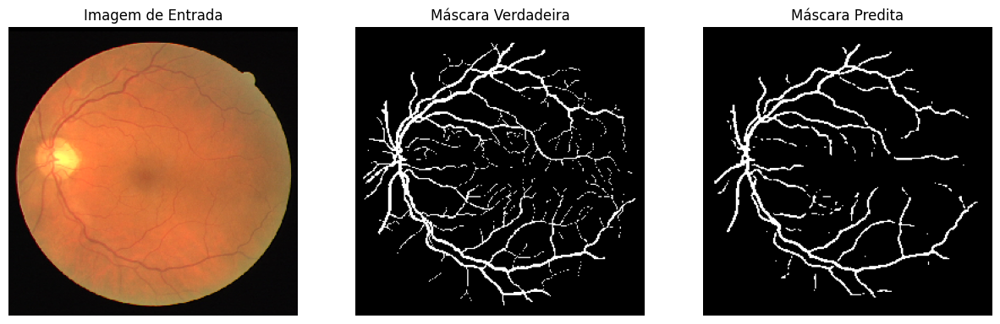

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


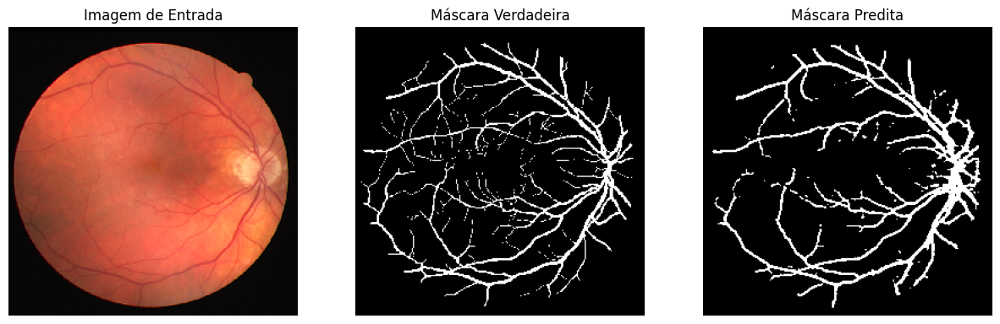

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step


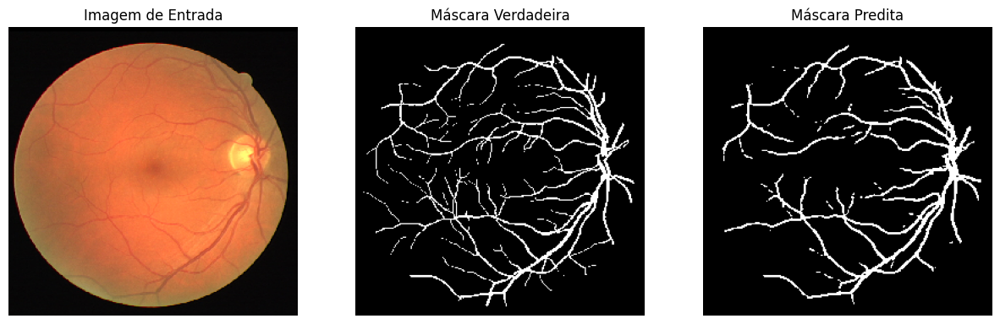

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


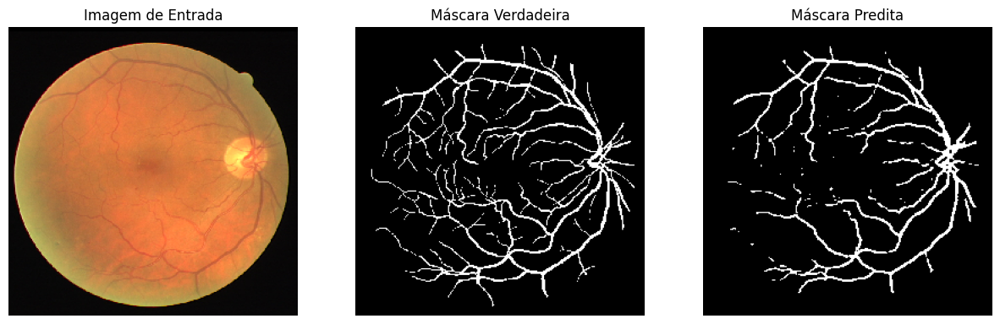

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


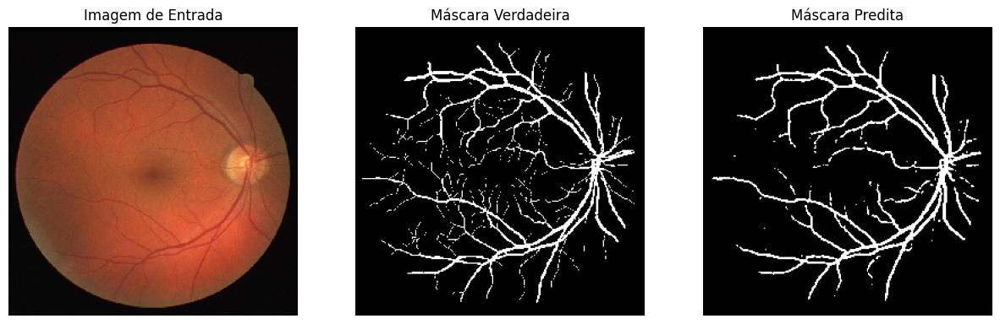


Avaliando o modelo model_efficientnetb0_sigmoid_aug=False no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.9608 - iou_score: 0.5922 - loss: 0.2568 - precision: 0.8272 - recall: 0.6862
loss: 0.25195786356925964
IOU Score: 0.5983220338821411
precision: 0.8318376541137695
recall: 0.6888236999511719
accuracy: 0.9605072140693665

Exemplos de predições do modelo model_efficientnetb0_sigmoid_aug=False:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


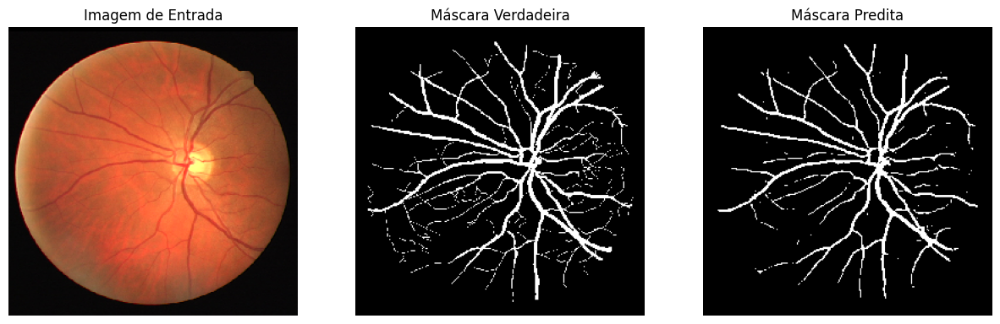

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


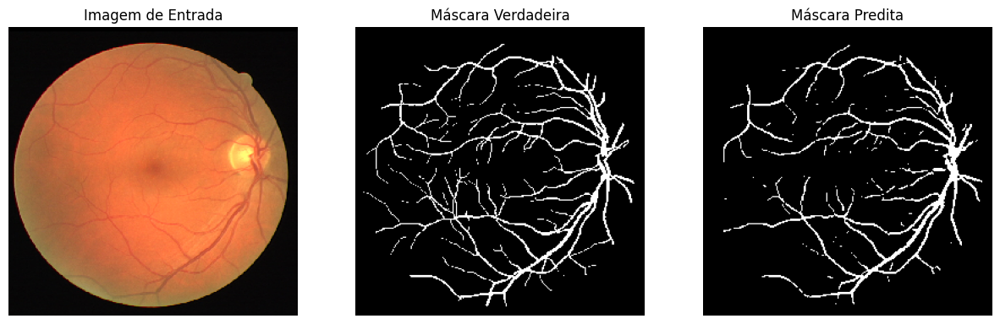

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


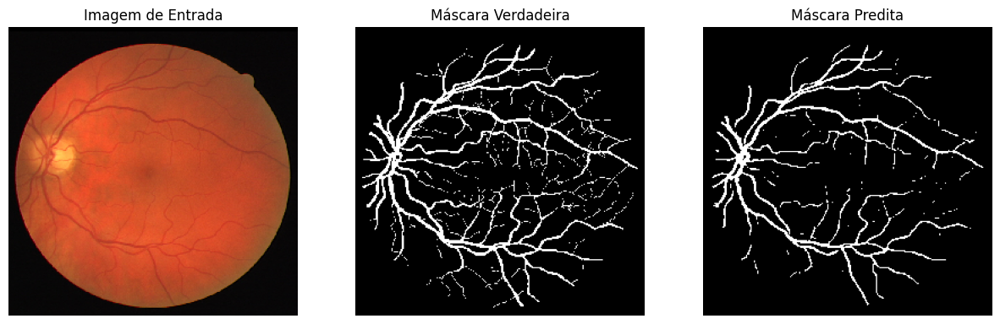

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


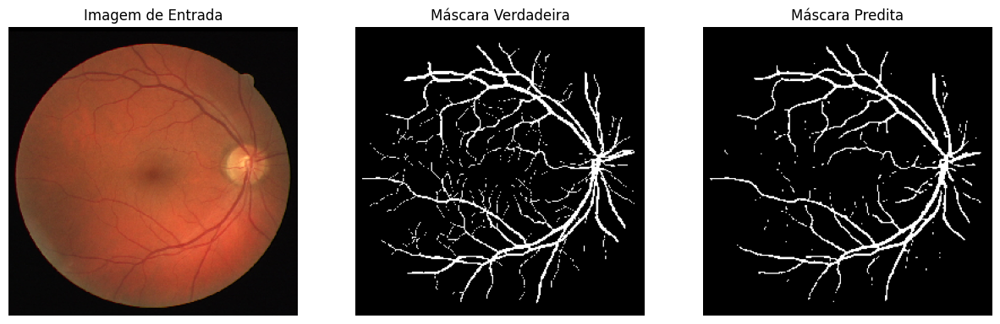

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step


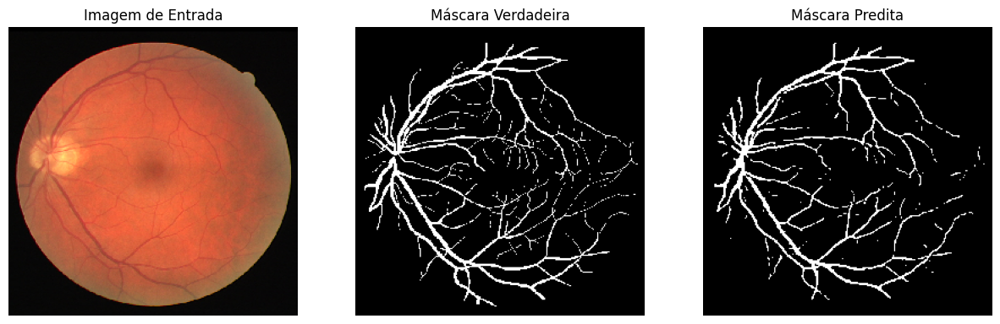


Avaliando o modelo model_efficientnetb0_softmax_aug=True no conjunto de teste:


/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 256, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - accuracy: 0.0874 - iou_score: 0.0874 - loss: 0.8393 - precision: 0.0874 - recall: 1.0000
loss: 0.8388836979866028
IOU Score: 0.08767852187156677
precision: 0.08767852932214737
recall: 1.0
accuracy: 0.08767852932214737

Exemplos de predições do modelo model_efficientnetb0_softmax_aug=True:


/home/semcovici/pesquisa/segmentation-of-blood-vessels-in-retinal-images/.conda/lib/python3.11/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (1, 256, 256, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


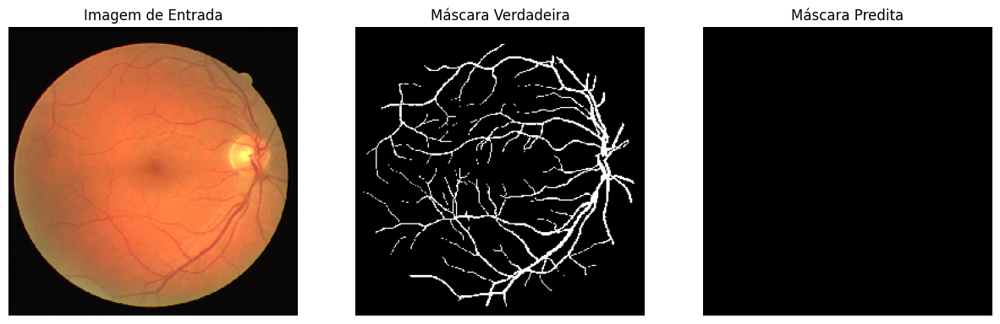

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


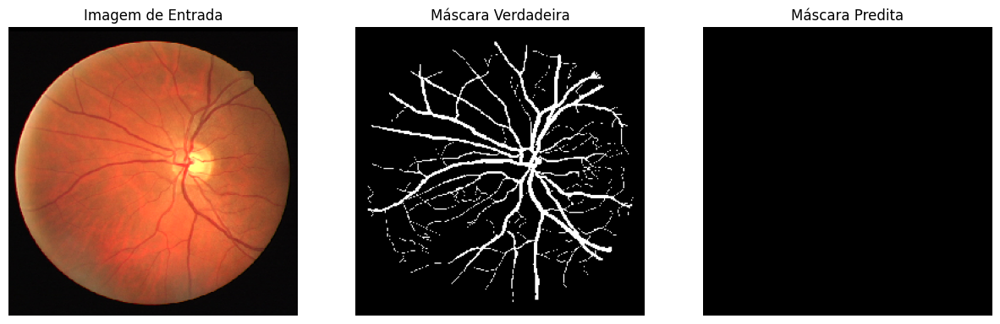

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


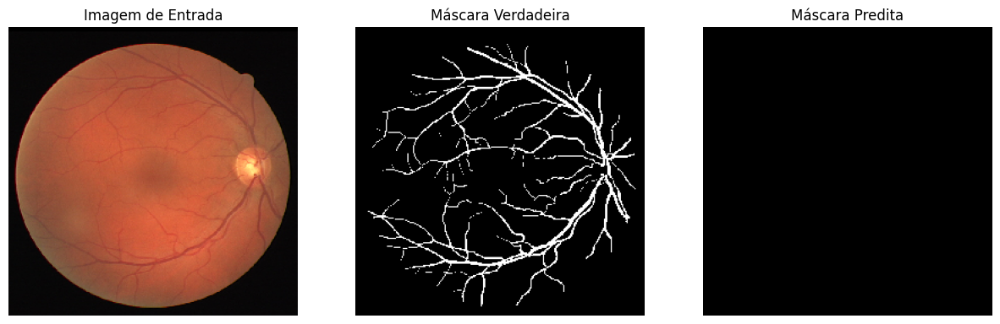

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


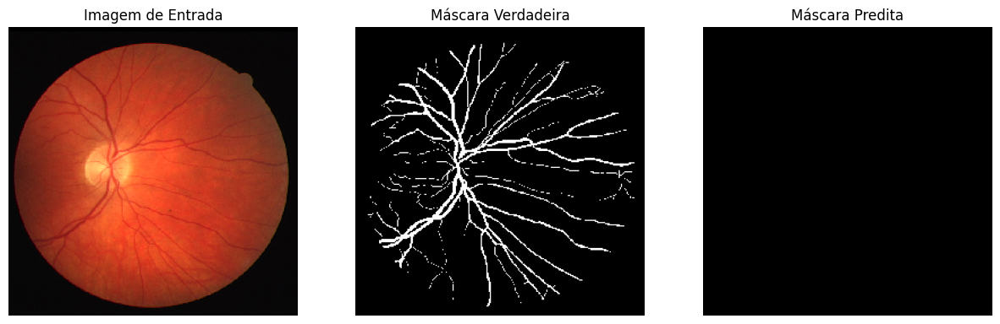

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


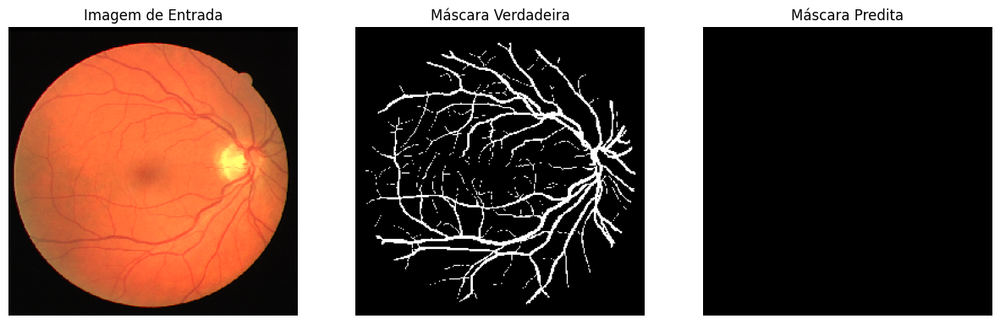


Avaliando o modelo model_efficientnetb0_softmax_aug=False no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - accuracy: 0.0860 - iou_score: 0.0860 - loss: 0.8418 - precision: 0.0860 - recall: 1.0000
loss: 0.8388837575912476
IOU Score: 0.08767852187156677
precision: 0.08767852932214737
recall: 1.0
accuracy: 0.08767852932214737

Exemplos de predições do modelo model_efficientnetb0_softmax_aug=False:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


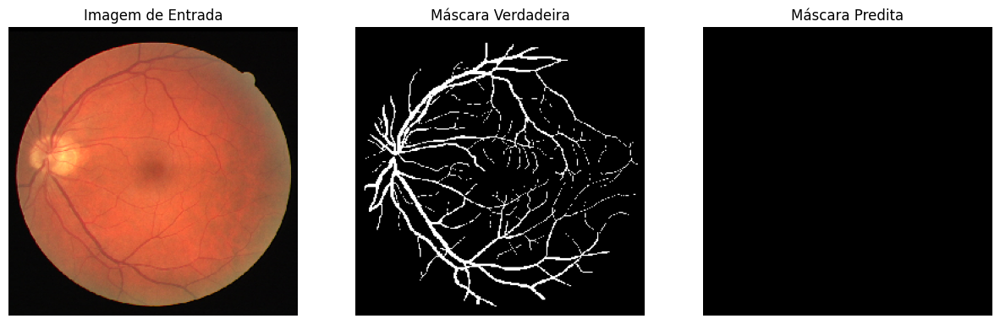

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step


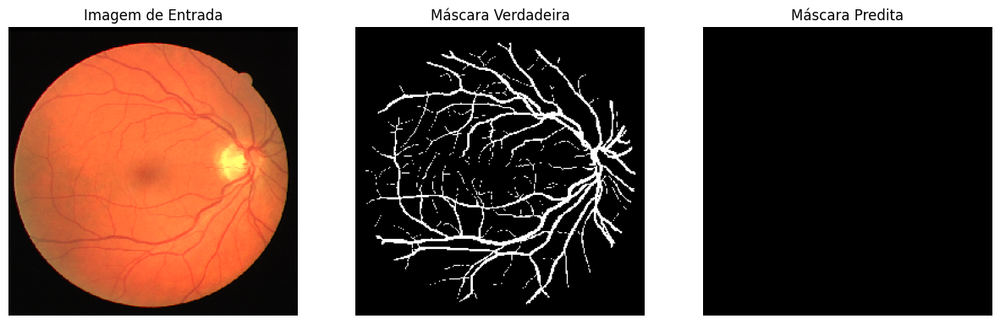

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


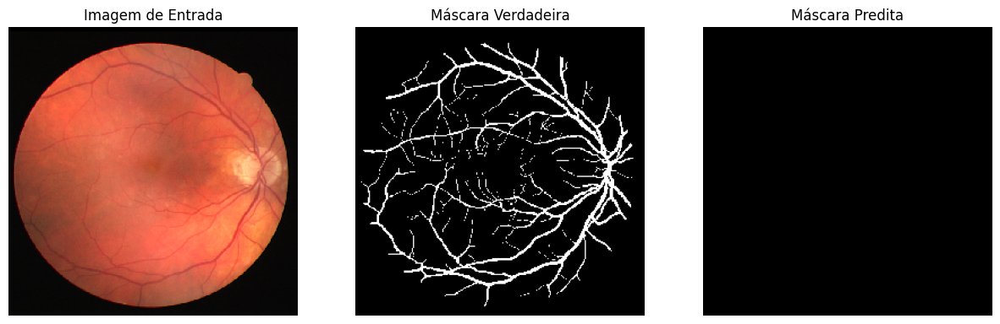

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


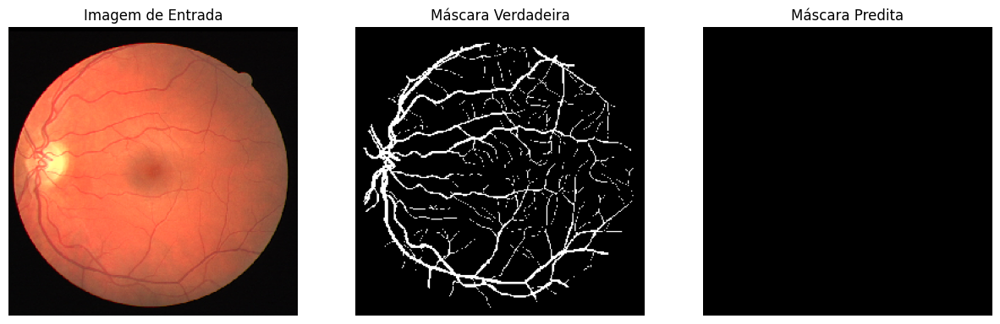

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step


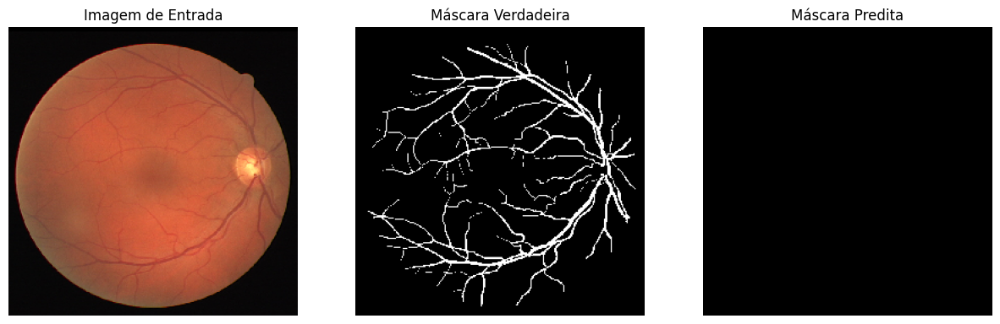


Avaliando o modelo model_None_sigmoid_aug=True no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.9470 - iou_score: 0.5551 - loss: 0.2871 - precision: 0.6651 - recall: 0.8059
loss: 0.2859986424446106
IOU Score: 0.5560482740402222
precision: 0.6809713244438171
recall: 0.7840100526809692
accuracy: 0.9488579034805298

Exemplos de predições do modelo model_None_sigmoid_aug=True:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 824ms/step


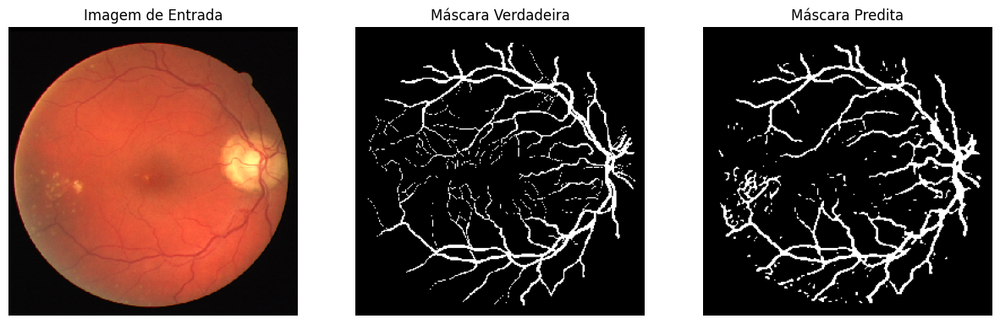

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


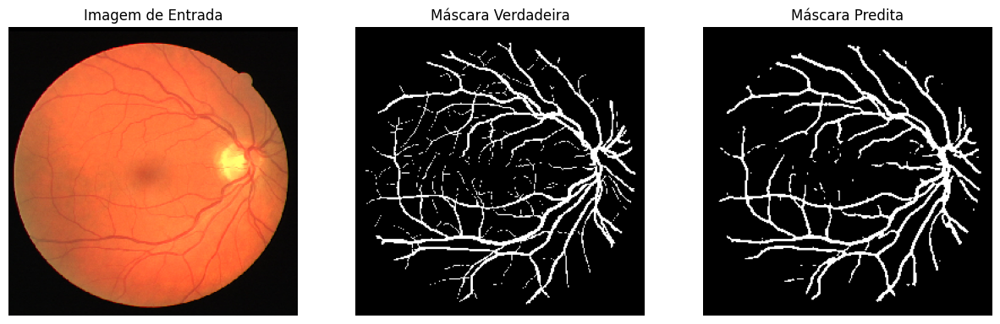

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step


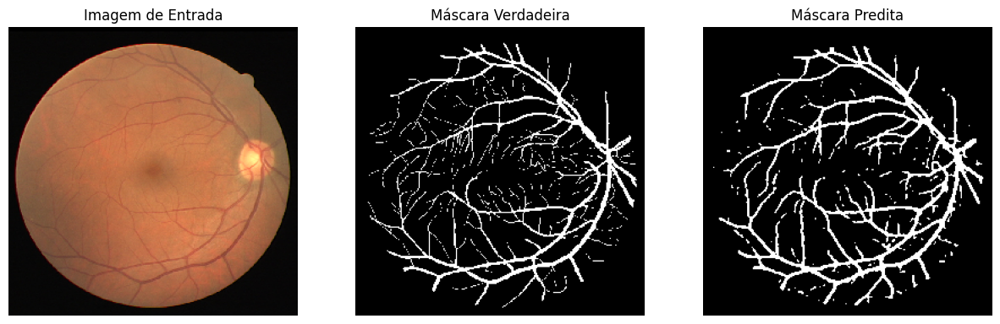

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step


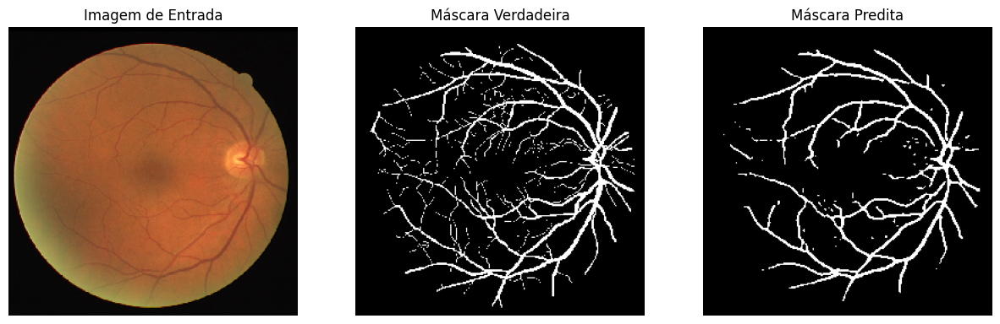

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


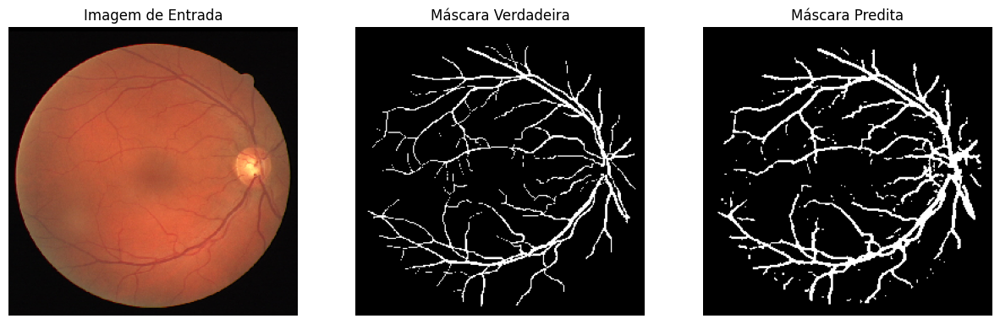


Avaliando o modelo model_None_sigmoid_aug=False no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - accuracy: 0.9576 - iou_score: 0.5839 - loss: 0.2635 - precision: 0.7878 - recall: 0.7223
loss: 0.26507118344306946
IOU Score: 0.5818681120872498
precision: 0.7828023433685303
recall: 0.7233166694641113
accuracy: 0.9581443667411804

Exemplos de predições do modelo model_None_sigmoid_aug=False:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step


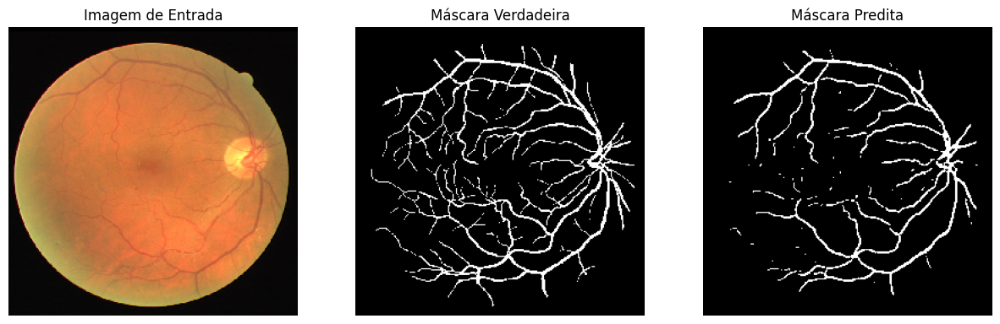

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step


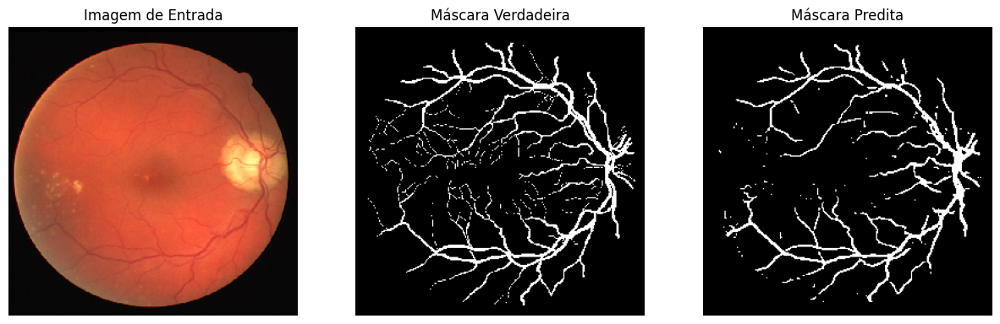

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


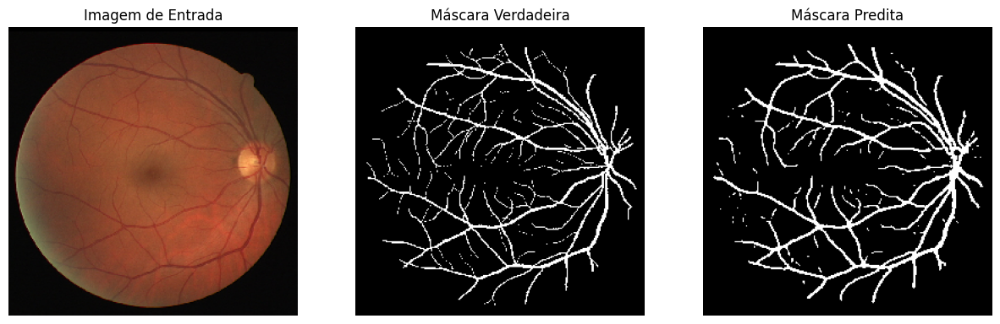

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step


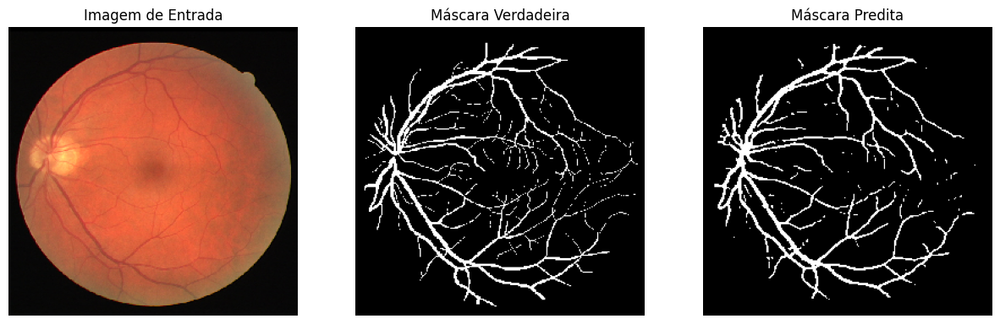

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step


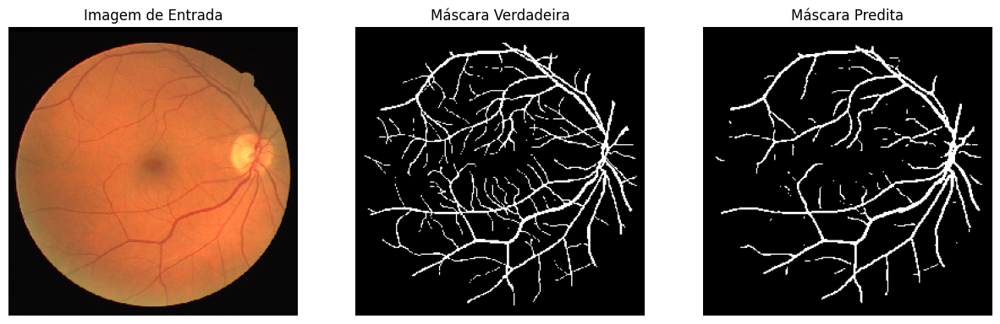


Avaliando o modelo model_None_softmax_aug=True no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - accuracy: 0.0855 - iou_score: 0.0855 - loss: 0.8425 - precision: 0.0855 - recall: 1.0000
loss: 0.8388836979866028
IOU Score: 0.08767852187156677
precision: 0.08767852932214737
recall: 1.0
accuracy: 0.08767852932214737

Exemplos de predições do modelo model_None_softmax_aug=True:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


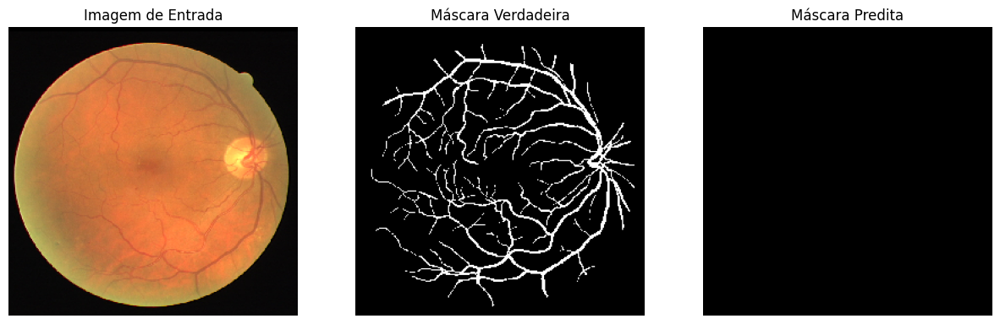

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step


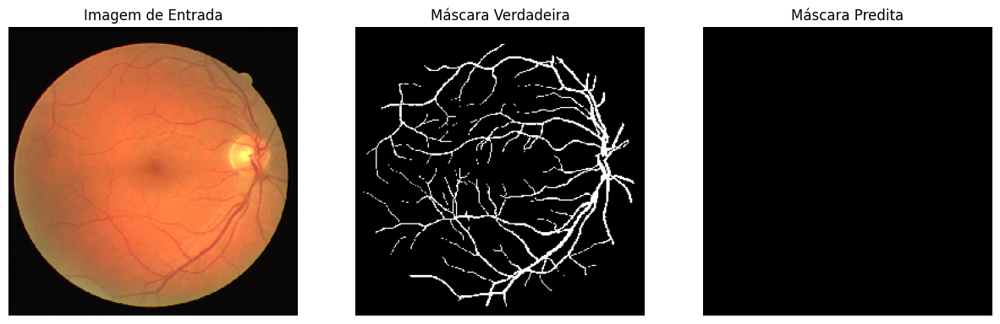

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step


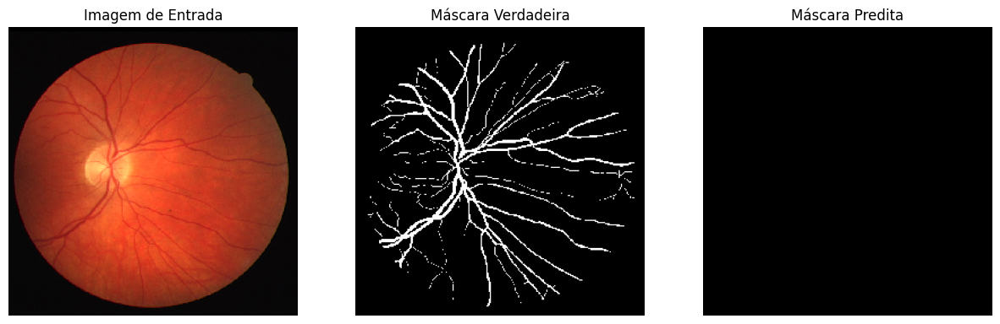

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


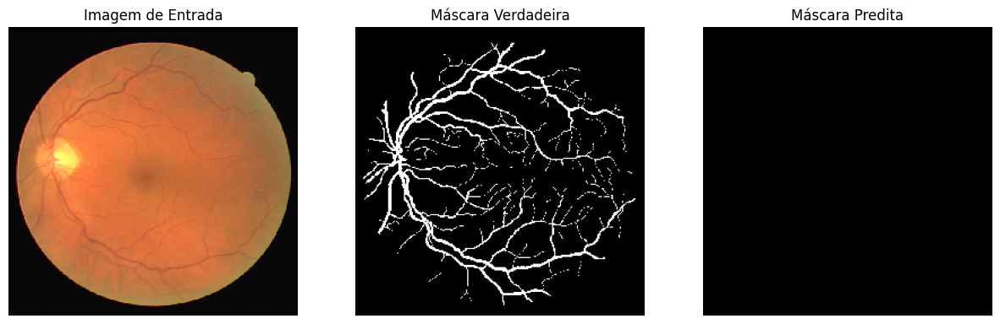

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


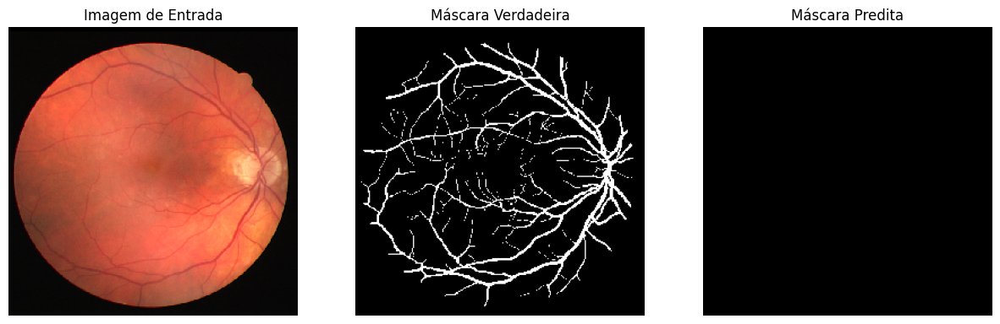


Avaliando o modelo model_None_softmax_aug=False no conjunto de teste:
20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - accuracy: 0.0856 - iou_score: 0.0856 - loss: 0.8424 - precision: 0.0856 - recall: 1.0000
loss: 0.8388836979866028
IOU Score: 0.08767852187156677
precision: 0.08767852932214737
recall: 1.0
accuracy: 0.08767852932214737

Exemplos de predições do modelo model_None_softmax_aug=False:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step


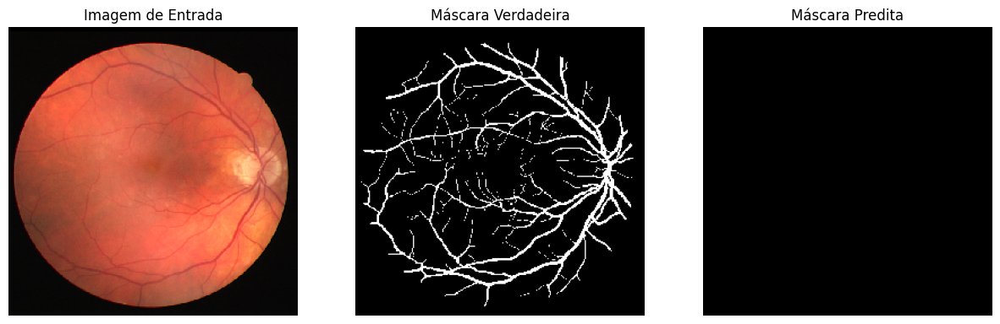

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step


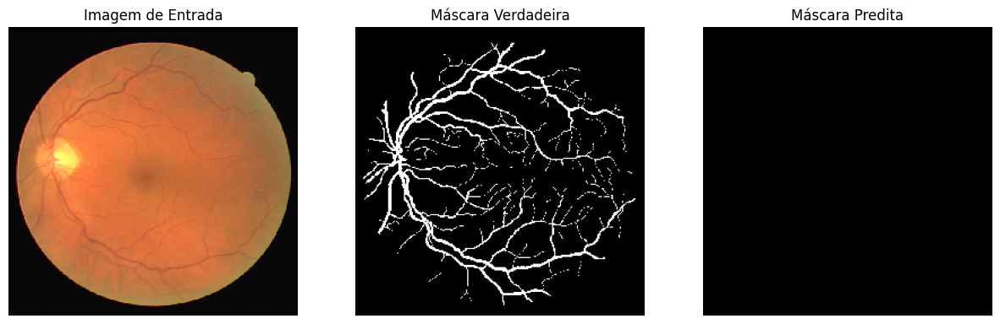

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step


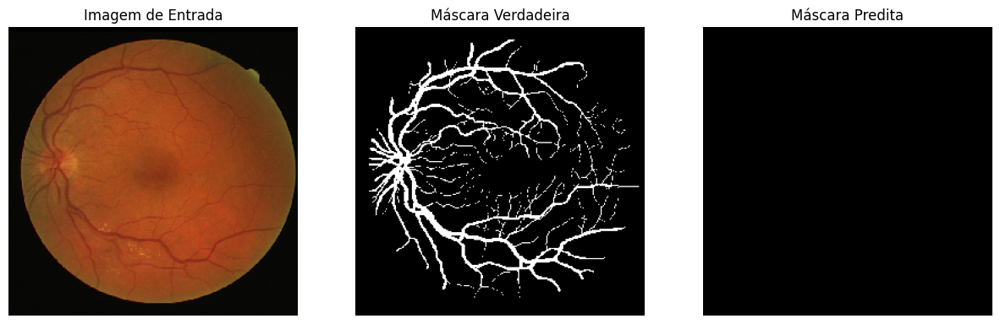

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step


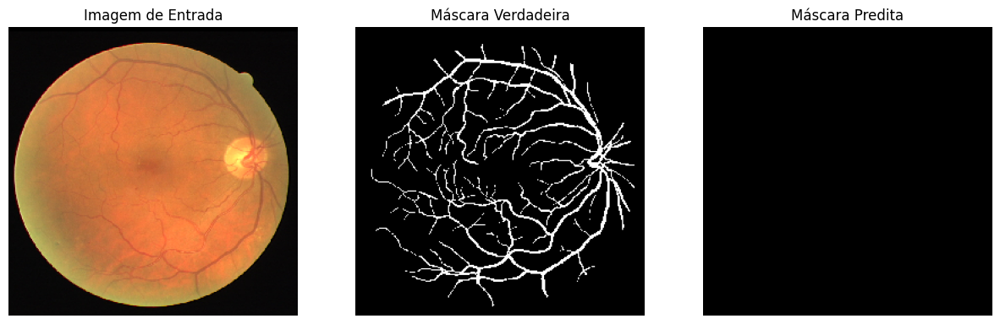

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


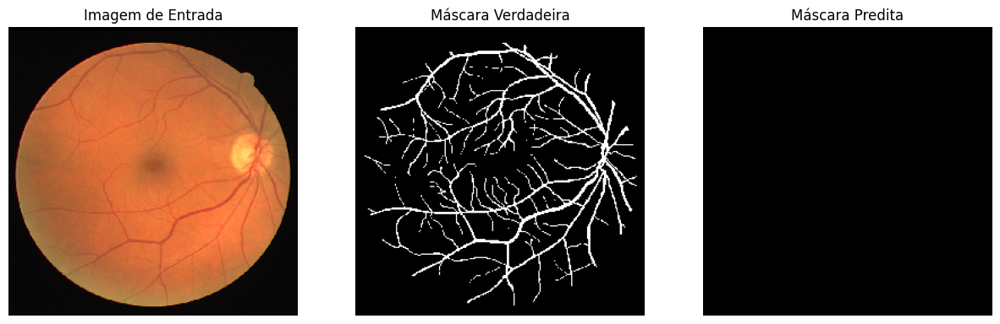


Resumo das métricas dos modelos:
                               model_name        backbone activation  \
0   model_efficientnetb0_sigmoid_aug=True  efficientnetb0    sigmoid   
1  model_efficientnetb0_sigmoid_aug=False  efficientnetb0    sigmoid   
2   model_efficientnetb0_softmax_aug=True  efficientnetb0    softmax   
3  model_efficientnetb0_softmax_aug=False  efficientnetb0    softmax   
4             model_None_sigmoid_aug=True            None    sigmoid   
5            model_None_sigmoid_aug=False            None    sigmoid   
6             model_None_softmax_aug=True            None    softmax   
7            model_None_softmax_aug=False            None    softmax   

   augmentation      loss  IOU Score  precision    recall  accuracy  
0          True  0.273582   0.570697   0.766407  0.748621  0.957954  
1         False  0.251958   0.598322   0.831838  0.688824  0.960507  
2          True  0.838884   0.087679   0.087679  1.000000  0.087679  
3         False  0.838884   0.087679 

In [40]:

# Inicialize a lista para armazenar as métricas
metrics_list = []
metric_names = ['loss', 'IOU Score',  'precision','recall','accuracy']
# Loop pelos experimentos para carregar e avaliar cada modelo
for backbone, activation, augmentation in experimentos:
    model_name = f'model_{backbone}_{activation}_aug={augmentation}'
    model_path = PATH_MODELS + f'model_file/best_{model_name}.keras'
    
    # Carregue o modelo com compile=False e safe_mode=True
    model = tf.keras.models.load_model(
        filepath=model_path,
        custom_objects=custom_objects,
        compile=False,
        safe_mode=True
    )
    
    # Recompile o modelo
    model.compile(optimizer=OPTIM, loss=LOSS, metrics=METRICS)
    
    # Avalie o modelo no conjunto de teste
    print(f"\nAvaliando o modelo {model_name} no conjunto de teste:")
    test_metrics = model.evaluate(test_dataset, verbose=1)
    
    # # Obtenha os nomes das métricas
    # metric_names = model.metrics_names
    
    # Exiba as métricas com seus nomes correspondentes
    for metric_name, metric_value in zip(metric_names, test_metrics):
        print(f"{metric_name}: {metric_value}")
    
    # Salve as métricas em um dicionário
    metrics_dict = {'model_name': model_name,
                    'backbone': backbone,
                    'activation': activation,
                    'augmentation': augmentation}

    for metric_name, metric_value in zip(metric_names, test_metrics):
        metrics_dict[metric_name] = metric_value

    metrics_list.append(metrics_dict)
    
    # Exiba 5 exemplos de predições no conjunto de teste
    print(f"\nExemplos de predições do modelo {model_name}:")
    for i in range(5):
        X, y_true = test_dataset[i]
        y_pred = model.predict(X)
        
        # Se necessário, ajuste as dimensões das máscaras
        image = X[0]
        mask_true = y_true[0, :, :, 0]  # Remova a dimensão extra se existir
        mask_pred = y_pred[0, :, :, 0]
        
        # Opcional: Binarize a máscara predita para melhor visualização
        mask_pred_binary = (mask_pred > 0.5).astype(np.float32)
        
        # Visualize a imagem, a máscara verdadeira e a máscara predita
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image)
        axes[0].set_title('Imagem de Entrada')
        axes[0].axis('off')
        
        axes[1].imshow(mask_true, cmap='gray')
        axes[1].set_title('Máscara Verdadeira')
        axes[1].axis('off')
        
        axes[2].imshow(mask_pred_binary, cmap='gray')
        axes[2].set_title('Máscara Predita')
        axes[2].axis('off')
        
        plt.show()

# Após o loop, crie um DataFrame com os resultados e imprima
metrics_df = pd.DataFrame(metrics_list)
print("\nResumo das métricas dos modelos:")
print(metrics_df)

In [42]:
# resultados ordenados pelo IOU
display(metrics_df.sort_values('IOU Score'))

,model_name,backbone,activation,augmentation,loss,IOU Score,precision,recall,accuracy
2,model_efficientnetb0_softmax_aug=True,efficientnetb0,softmax,True,0.838884,0.087679,0.087679,1.000000,0.087679
3,model_efficientnetb0_softmax_aug=False,efficientnetb0,softmax,False,0.838884,0.087679,0.087679,1.000000,0.087679
6,model_None_softmax_aug=True,None,softmax,True,0.838884,0.087679,0.087679,1.000000,0.087679
7,model_None_softmax_aug=False,None,softmax,False,0.838884,0.087679,0.087679,1.000000,0.087679
4,model_None_sigmoid_aug=True,None,sigmoid,True,0.285999,0.556048,0.680971,0.784010,0.948858
0,model_efficientnetb0_sigmoid_aug=True,efficientnetb0,sigmoid,True,0.273582,0.570697,0.766407,0.748621,0.957954
5,model_None_sigmoid_aug=False,None,sigmoid,False,0.265071,0.581868,0.782802,0.723317,0.958144
1,model_efficientnetb0_sigmoid_aug=False,efficientnetb0,sigmoid,False,0.251958,0.598322,0.831838,0.688824,0.960507


### Análise dos Resultados:

Ao analisar os resultados, observamos que a técnica de *data augmentation* não trouxe melhorias significativas para o desempenho dos modelos. Pelo contrário, notou-se uma ligeira piora em alguns casos. Isso pode ser atribuído a possíveis problemas na implementação do *data augmentation*, dado que ele foi feito parcialmente de forma manual. A técnica aplicada pode não ter sido adequada para a tarefa de segmentação de vasos sanguíneos, ou pode ter introduzido ruídos que dificultaram o aprendizado do modelo.

Além disso, os modelos que utilizaram a função de ativação *softmax* apresentaram o pior desempenho, tanto em termos de *accuracy* quanto em *IOU Score*, o que indica que o *softmax* pode não ser a melhor escolha para essa tarefa específica. Quando comparamos as predições visuais geradas por esses modelos, percebemos que eles não conseguem segmentar adequadamente as regiões de interesse, frequentemente preenchendo áreas inteiras com valores incorretos.

Por outro lado, os modelos que utilizaram a função de ativação *sigmoid* apresentaram um desempenho superior. O melhor modelo foi o que utilizou a combinação de *sigmoid* e *efficientnetb0* como *backbone*, sem *data augmentation*, alcançando um *accuracy* de 96.05% e um *IOU Score* de 0.598. Esse resultado sugere que a ativação *sigmoid*, combinada com o *backbone* *efficientnetb0*, é uma configuração mais adequada para a tarefa de segmentação.

Finalmente, os modelos sem *backbone* também apresentaram um desempenho relativamente bom, porém não superaram aqueles com *backbone*. Isso evidencia a importância de utilizar arquiteturas mais robustas para melhorar a qualidade das predições.

### Problemas Encontrados Durante o Desenvolvimento:

Durante o desenvolvimento, enfrentamos diversas dificuldades, especialmente relacionadas à biblioteca `segmentation_models`. O processo de instalação dessa biblioteca não é bem documentado, o que dificultou a identificação das versões corretas dos pacotes necessários para a execução do modelo. Essa falta de clareza aumentou o tempo gasto para solucionar problemas de compatibilidade entre dependências.

Além disso, a documentação insuficiente dessa biblioteca dificultou a resolução de erros relacionados à configuração dos modelos, especialmente ao ajustar o *backbone* e as funções de ativação. Esses problemas atrasaram o processo de desenvolvimento e afetaram a reprodutibilidade dos experimentos. Também houve questões menores com bibliotecas auxiliares que, apesar de serem resolvidas com ajustes manuais, adicionaram complexidade ao desenvolvimento.